# 情報論A 第8回：やってみよう三次元復元

---
## **末尾にレポート部分があるので、そこを埋めて実行後提出してください**
---

参考：「他人のGPUで"大規模"フォトグラメトリしたい！！」
https://qiita.com/kotauchisunsun/items/5777c94faabdef1523c9


- 実行前に、GPUランタイムに接続していることを確認してください（最近のColabなら多分大丈夫）
- 無料版Colabは、GPUランタイムの接続可能時間に制限があります。これを超えたら、`n`時間くらい待ってから再挑戦してください。`n`はサーバの込み具合により変わるらしいですが、一説によると<s>12～24時間くらいらしいです</s>。←いまみたら5時間弱だった。「リソース」から残り時間が見れます。
- 無料枠を超えないために、入力画像数を数十枚程度に抑えるのが良いでしょう（方法1-1を使う場合は除く）。

## 補助データなど：
- [サンプル画像](https://drive.google.com/file/d/13qDSyqqi3r0tevGgi0sMH90DvDSL7Txd/view?usp=sharing)
- [Colabに定期的にアクセスするためのバッチファイル](https://github.com/fumio125/3D_lecture/blob/master/colab.bat)（右クリック→リンク先を保存）



## 1. Google Drive を使う版
1. Google Driveの「マイドライブ/Colab Notebooks/johoronA/」下に「images」フォルダを解凍してコピーする
2. 以下いずれかのセルを実行してしばし待つ（時間がかかりそうな場合はたまにアクセスする）
3. 「3D_lecture/results」以下に結果が出力される

### 1-1. Google Drive に数GB以上の余裕がある場合
Google Colabの制約で途中でランタイムが落ちても、次のセルを起動すれば途中からやりなおせます

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

!pwd
!wget https://github.com/alicevision/Meshroom/releases/download/v2021.1.0/Meshroom-2021.1.0-linux-cuda10.tar.gz
!mkdir "./meshroom_exe"
!tar xf "./Meshroom-2021.1.0-linux-cuda10.tar.gz" -C "./meshroom_exe" --strip-components 1

!mkdir "/content/drive/My Drive/Colab Notebooks/johoronA/result"
!mkdir "/content/drive/My Drive/Colab Notebooks/johoronA/log"

!./meshroom_exe/meshroom_batch \
    --input "/content/drive/My Drive/Colab Notebooks/johoronA/images" \
    --output "/content/drive/My Drive/Colab Notebooks/johoronA/result" \
    --cache "/content/drive/My Drive/Colab Notebooks/johoronA/cache" \
    --forceStatus \
    | tee "/content/drive/My Drive/Colab Notebooks/johoronA/log/"`date '+%Y%m%d%H%M%S'`".log"

!rm -rf "/content/drive/My Drive/Colab Notebooks/johoronA/cache"

### 1-2. Google Drive の容量に余裕がない場合
Google Colabの制約で途中でランタイムが落ちたら、最初からやり直しになります

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

!pwd
!wget https://github.com/alicevision/Meshroom/releases/download/v2021.1.0/Meshroom-2021.1.0-linux-cuda10.tar.gz
!mkdir "./meshroom_exe"
!tar xf "./Meshroom-2021.1.0-linux-cuda10.tar.gz" -C "./meshroom_exe" --strip-components 1

!mkdir "/content/drive/My Drive/Colab Notebooks/johoronA/result"
!mkdir "/content/drive/My Drive/Colab Notebooks/johoronA/log"

!./meshroom_exe/meshroom_batch \
    --input "/content/drive/My Drive/Colab Notebooks/johoronA/images" \
    --output "/content/drive/My Drive/Colab Notebooks/johoronA/result" \
    --forceStatus \
    | tee "/content/drive/My Drive/Colab Notebooks/johoronA/log/"`date '+%Y%m%d%H%M%S'`".log"


## 2. Google drive を使わない版
1. 入力画像を、手元のPCの「images」フォルダ内に入れる
2. 左にあるフォルダマークを押し、「images」フォルダを「ファイル」内にドラッグアンドドロップ
3. 次のセルを実行してしばし待つ（時間がかかりそうな場合はたまにアクセスする
4. 「results」以下に結果が出力されるので、右クリック→ダウンロード


In [ ]:
# Google Colabの制約で途中でランタイムが落ちたら、最初からやり直しになります
# ランタイムとともに結果も消えるので、計算が終わったらすぐに結果をダウンロードしてください

!pwd
!wget https://github.com/alicevision/Meshroom/releases/download/v2021.1.0/Meshroom-2021.1.0-linux-cuda10.tar.gz
!mkdir "./meshroom_exe"
!tar xf "./Meshroom-2021.1.0-linux-cuda10.tar.gz" -C "./meshroom_exe" --strip-components 1

!mkdir "./result"
!mkdir "./log"

!./meshroom_exe/meshroom_batch \
    --input "./images" \
    --output "./result" \
    --forceStatus \
    | tee "./log/"`date '+%Y%m%d%H%M%S'`".log"


## 復元が終わったら
出来上がった.objファイルをMeshLabなどで読み込んで眺めましょう。

https://www.meshlab.net/

## Tips

* 「たまにアクセスする」ためのバッチファイル

  * https://qiita.com/kotauchisunsun/items/5777c94faabdef1523c9 のものを改変。
  * Windows用、64 bit Google Chrome用です。拡張子"bat"で保存してください。
  * 起動後、colabファイルのURL（```https://colab.research.google.com/drive/...```）を入力してください。


```
echo off
set /P URL="Copy-and-paste Google Colab URL: "
:LOOP
    "C:\Program Files\Google\Chrome\Application\chrome.exe" %URL%
    timeout 3600
goto :LOOP

```


## Trouble shooting

* 何回やっても Google Colab の制限時間を超える
  * 画像枚数減らしましょう
* 結果がなんも出ない、という場合は以下を確認しましょう
  * セルの下に出てきたログを読むと、``[`` に続いてヒントが書いてあるかも
    * （Google ドライブを使っている場合、 meshroom /log 以下にもログが保存されます）
  * 画像の読み込みに失敗してるっぽい
    * iPhone などで撮影すると heic 形式の画像になってしまう
    * 「設定」→「カメラフォーマット」より、「互換性優先」で jpg で撮影できます
    * もう撮影した、という場合は jpg などに変換しましょう
  * 画像の対応付けが不十分で、カメラの位置推定できていない
    * カメラ間の視野の重複が不十分だと、対応付けに失敗します
      * 密に（ほんの少しずつ移動しながら）撮影しましょう。サンプルのワニ博士の画像参照
    * 視差が出ない撮影方法になっていないか
      * カメラを「その場で回す」のは、ほとんど無意味です
      * 距離を計算するためには視差＝カメラの移動が必要！
  * 撮影対象が動いている
    * 復元したい対象は静止している必要があります
    * 動く物体が視野内に小さく写りこんでいる、というくらいなら多くの場合大丈夫




## 既知の問題

* 最新版（Meshroom 2023.2.0）はバッチ出力のテクスチャがデフォルトでexr形式になる。
  * exrのテクスチャはMeshLabで読み込めないので、オプションを変えてpngか何かで出力したいものの、コマンドライン上でテクスチャ形式の指定方法がわからないので過去のバージョンを使っています。
  * Blenderで眺めるならexrテクスチャでもOK



---


---






#今週の課題

## 説明
- 自分で撮影して復元してみましょう
- “.jpg”ファイルとして撮影
  - （iPhoneの場合は「設定」→「カメラフォーマット」より、「互換性優先」）
- 同じ物体を見つつ、視点位置を動かしながら数十枚撮影
- 可能なら、きれいに復元できるよういろいろ撮影方法を工夫してみると良いでしょう

**まずは自分で撮影したデータで上のセルを実行し、その後、その内容を以下のセルを適宜修正して報告してください**



## レポート部分（適宜修正してください）

### 撮影対象

ワニ博士のぬいぐるみ

### 撮影枚数

16枚

### 撮影画像例

撮影画像のうち1枚を"imag.jpg"としてcolabのファイルにアップロードして以下を実行（ファイル名は適宜リネームしても良いです）


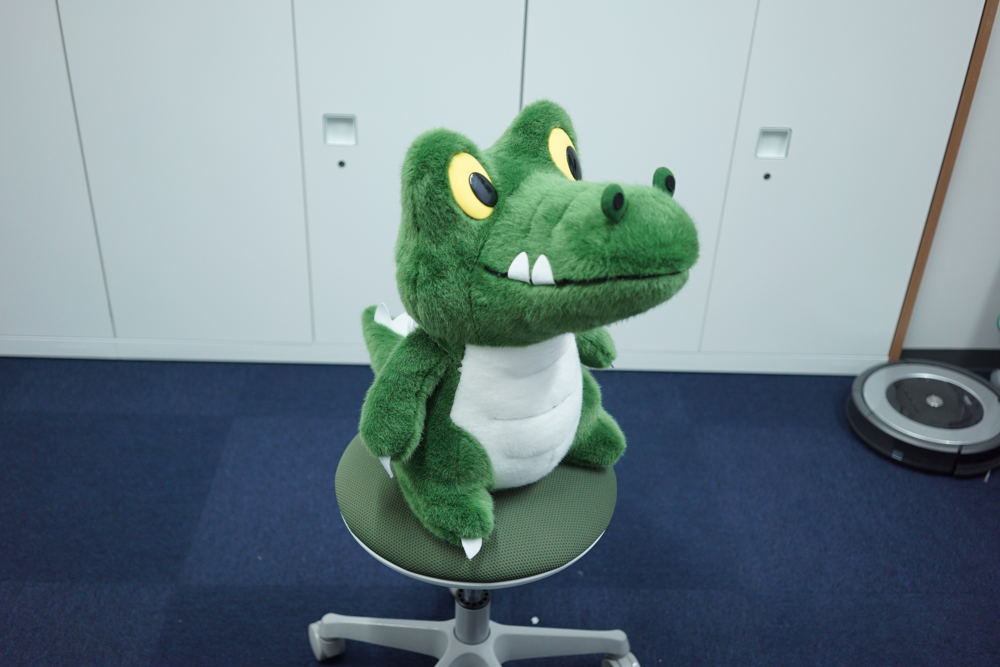

In [10]:
import cv2
from google.colab.patches import cv2_imshow

img = cv2.imread("image.jpg")
cv2_imshow(img)

### 結果
MeshLabなどの3Dモデルビューワで開いた結果のスクリーンショットを"result.jpg"としてcolabのファイルにアップロードして以下を実行（ファイル名は適宜リネームしても良いです）


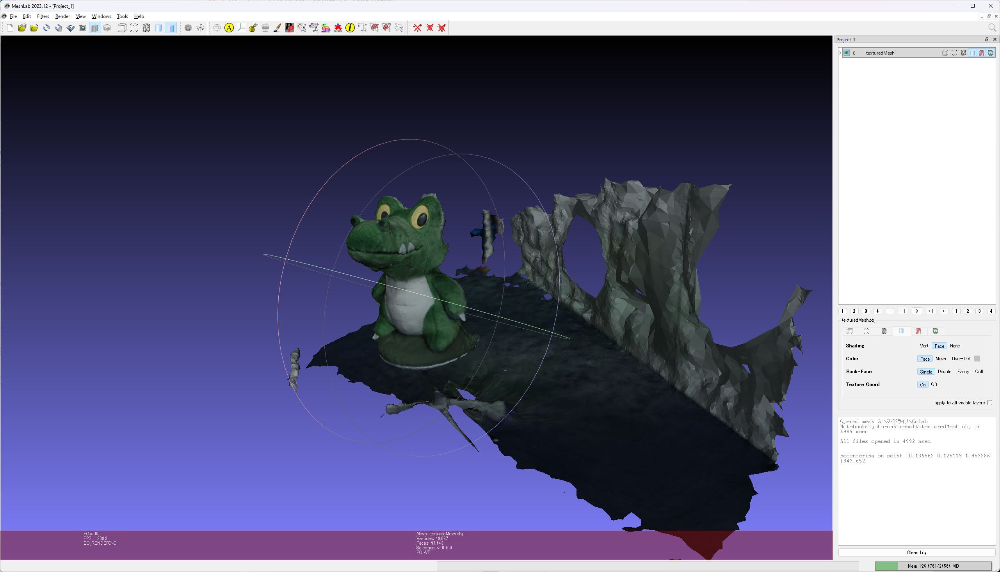

In [11]:
import cv2
from google.colab.patches import cv2_imshow

img = cv2.imread("result.jpg")
cv2_imshow(img)

###補足

ここ頑張った、とか何かあれば書いてください。


---

---